<img src='https://training.dwit.edu.np/frontend/images/computer-training-institute.png'>
<h1>Data Science and Machine learning in Python</h1>
<h3>Instructor: <a href='https://www.kaggle.com/atishadhikari'> Atish Adhikari</a></h3>
<hr>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling

In [2]:
data = pd.read_csv("datasets/kc_house_data.csv")

In [3]:
data.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [4]:
to_drop = ["id", "date", "zipcode", "lat", "long"]

data.drop(to_drop, inplace=True, axis=1)

In [5]:
data.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'sqft_living15',
       'sqft_lot15'],
      dtype='object')

In [6]:
data.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,sqft_living15,sqft_lot15
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,1340,5650
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,1690,7639
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,2720,8062
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,1360,5000
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,1800,7503


In [7]:
data.profile_report(progress_bar=False)

In [8]:
cat_cols = ["bedrooms", "bathrooms", "floors", "view", "condition", "grade", "waterfront"]

In [9]:
data.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'sqft_living15',
       'sqft_lot15'],
      dtype='object')

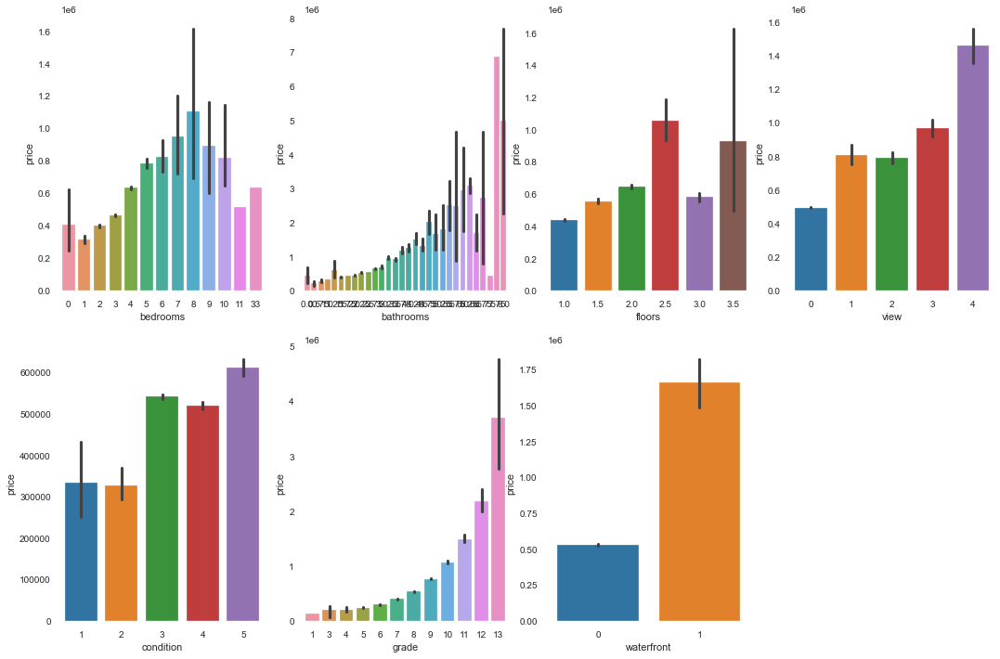

In [10]:
plt.figure(figsize=(18, 12))
for index, col in enumerate(cat_cols):
    plt.subplot(2,4,index+1)
    sns.barplot(col, "price", data=data)
    
plt.show()

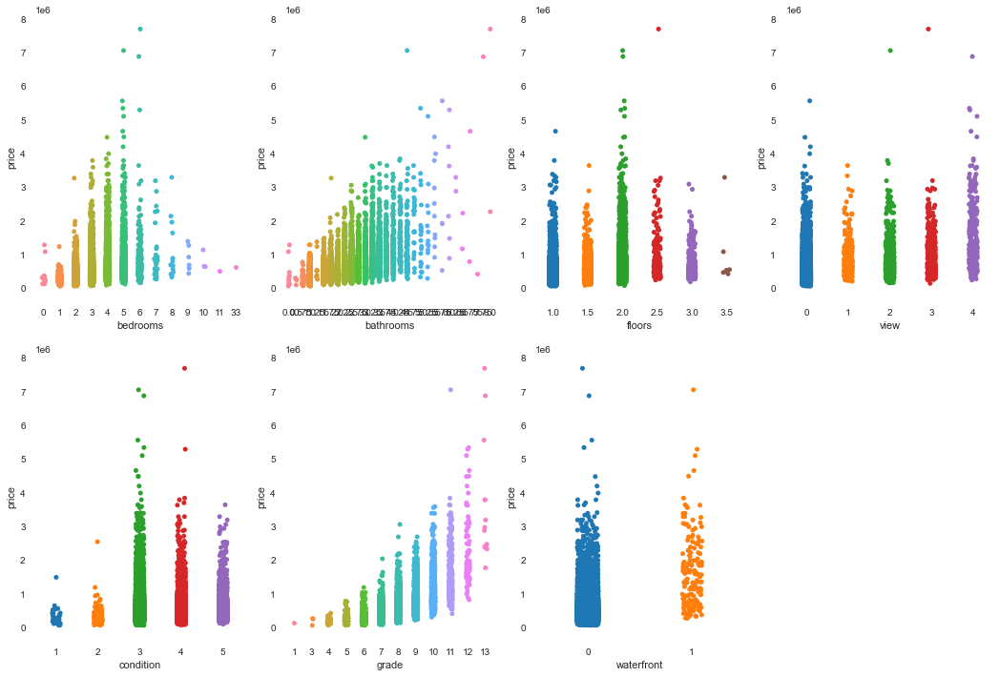

In [11]:
plt.figure(figsize=(18, 12))
for index, col in enumerate(cat_cols):
    plt.subplot(2,4,index+1)
    sns.stripplot(col, "price", data=data)
    
plt.show()



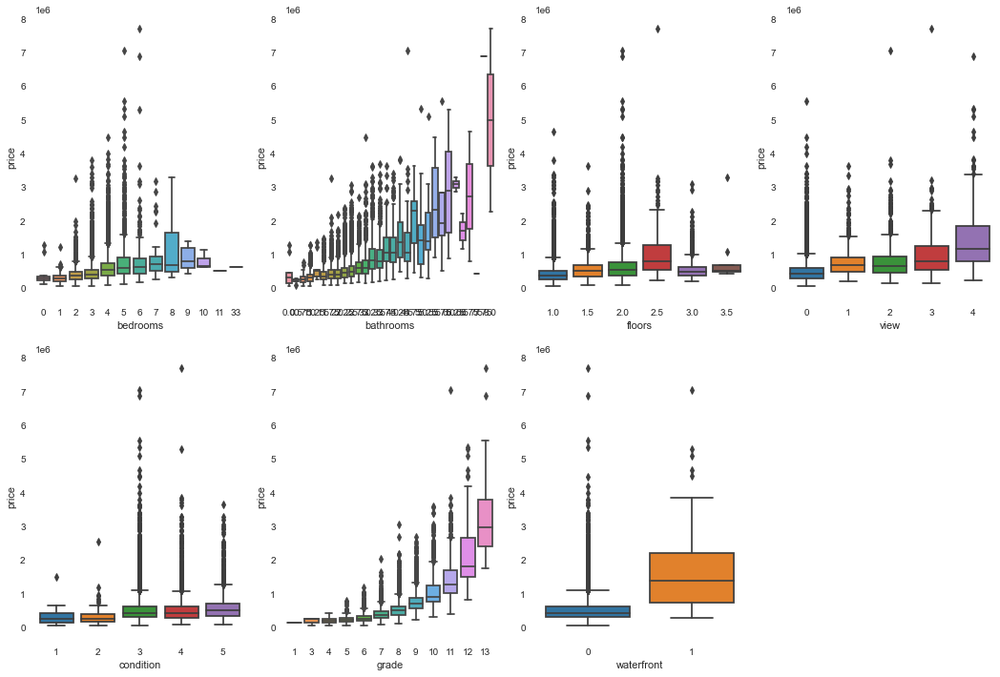

In [12]:
plt.figure(figsize=(18, 12))
for index, col in enumerate(cat_cols):
    plt.subplot(2,4,index+1)
    sns.boxplot(col, "price", data=data)
    
plt.show()

In [13]:
num_cols = [x for x in data.columns if (x not in cat_cols and x != "price")]

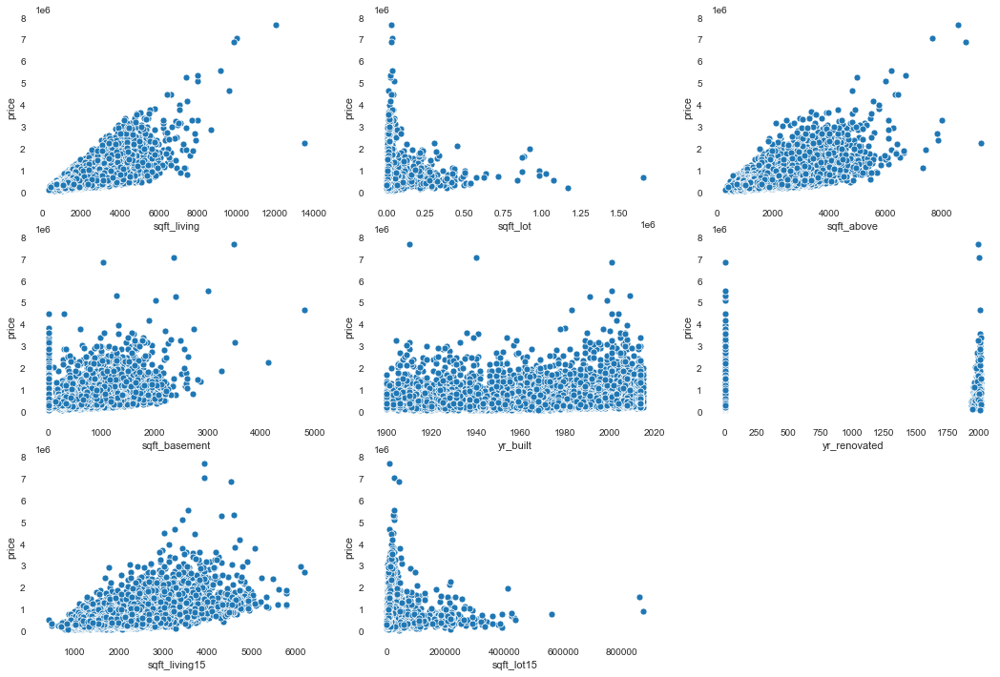

In [14]:
plt.figure(figsize=(18, 12))

for index, col in enumerate(num_cols):
    plt.subplot(3,3,index+1)
    sns.scatterplot(col, "price",  data=data)
    
plt.show()

In [15]:
X = data.drop("price", axis=1)
y = data["price"]

In [16]:
X[ y > 1000000 ].shape

(1465, 15)

In [17]:
X = X[ y < 1000000 ]
y = y[ y < 1000000 ]

In [18]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [19]:
scaler = StandardScaler()
X = scaler.fit_transform(X)
y = y / 1000 #price scale changed to 1k

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [20]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

In [21]:
X.shape
#in rows in input

(20121, 15)

In [22]:
model = Sequential()

model.add(Dense(input_dim=15, units=16, activation="tanh"))
model.add(Dense(units=8, activation="tanh"))
model.add(Dense(units=8, activation="tanh"))
model.add(Dense(units=1, activation="relu"))

model.compile(loss="mse", metrics=["mae"], optimizer="adam")

In [23]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 16)                256       
_________________________________________________________________
dense_1 (Dense)              (None, 8)                 136       
_________________________________________________________________
dense_2 (Dense)              (None, 8)                 72        
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 9         
Total params: 473
Trainable params: 473
Non-trainable params: 0
_________________________________________________________________


In [24]:
es = EarlyStopping(monitor="val_loss", patience=8)
checkpoint = ModelCheckpoint("model.h5")

In [25]:
history = model.fit(X_train, y_train, epochs=500, validation_split=0.15)

Epoch 1/500
428/428 [==============================] - 1s 2ms/step - loss: 252540.6719 - mae: 462.9502 - val_loss: 246181.4688 - val_mae: 456.0407
Epoch 2/500
428/428 [==============================] - 1s 1ms/step - loss: 246875.6406 - mae: 456.8006 - val_loss: 242164.5312 - val_mae: 451.6091
Epoch 3/500
428/428 [==============================] - 1s 1ms/step - loss: 243076.8594 - mae: 452.6174 - val_loss: 238545.0938 - val_mae: 447.5771
Epoch 4/500
428/428 [==============================] - 1s 1ms/step - loss: 239507.3594 - mae: 448.6562 - val_loss: 235061.9844 - val_mae: 443.6622
Epoch 5/500
428/428 [==============================] - 0s 1ms/step - loss: 236044.0000 - mae: 444.7783 - val_loss: 231664.8750 - val_mae: 439.8102
Epoch 6/500
428/428 [==============================] - 1s 1ms/step - loss: 232653.5312 - mae: 440.9381 - val_loss: 228326.3281 - val_mae: 435.9916
Epoch 7/500
428/428 [==============================] - 1s 1ms/step - loss: 229317.7656 - mae: 437.1345 - val_loss: 225

428/428 [==============================] - 1s 1ms/step - loss: 103346.4844 - mae: 258.3942 - val_loss: 100947.3906 - val_mae: 254.1180
Epoch 57/500
428/428 [==============================] - 1s 1ms/step - loss: 101496.2031 - mae: 255.1335 - val_loss: 99135.9766 - val_mae: 250.9024
Epoch 58/500
428/428 [==============================] - 1s 1ms/step - loss: 99675.4141 - mae: 251.9462 - val_loss: 97349.3047 - val_mae: 247.7234
Epoch 59/500
428/428 [==============================] - 1s 1ms/step - loss: 97882.3047 - mae: 248.7875 - val_loss: 95594.2812 - val_mae: 244.5867
Epoch 60/500
428/428 [==============================] - 1s 1ms/step - loss: 96116.4062 - mae: 245.6643 - val_loss: 93864.5391 - val_mae: 241.4894
Epoch 61/500
428/428 [==============================] - 1s 1ms/step - loss: 94379.9375 - mae: 242.5921 - val_loss: 92166.4297 - val_mae: 238.4643
Epoch 62/500
428/428 [==============================] - 1s 1ms/step - loss: 92670.2188 - mae: 239.5751 - val_loss: 90493.8906 - val_ma

428/428 [==============================] - 1s 1ms/step - loss: 37991.3086 - mae: 142.6986 - val_loss: 37124.0430 - val_mae: 140.1452
Epoch 113/500
428/428 [==============================] - 1s 1ms/step - loss: 37372.9336 - mae: 141.5144 - val_loss: 36540.0078 - val_mae: 139.1072
Epoch 114/500
428/428 [==============================] - 1s 1ms/step - loss: 36778.1484 - mae: 140.4329 - val_loss: 35974.7188 - val_mae: 138.3068
Epoch 115/500
428/428 [==============================] - 0s 1ms/step - loss: 36196.1211 - mae: 139.3065 - val_loss: 35392.7969 - val_mae: 137.1335
Epoch 116/500
428/428 [==============================] - 1s 1ms/step - loss: 35635.2852 - mae: 138.3378 - val_loss: 34836.8438 - val_mae: 135.8066
Epoch 117/500
428/428 [==============================] - 1s 1ms/step - loss: 35078.8164 - mae: 137.2337 - val_loss: 34348.3086 - val_mae: 135.4171
Epoch 118/500
428/428 [==============================] - 1s 1ms/step - loss: 34548.1484 - mae: 136.2942 - val_loss: 33806.4727 - val

Epoch 168/500
428/428 [==============================] - 1s 1ms/step - loss: 18306.2871 - mae: 104.4838 - val_loss: 18021.8594 - val_mae: 103.0946
Epoch 169/500
428/428 [==============================] - 0s 1ms/step - loss: 18161.9648 - mae: 104.0955 - val_loss: 17903.4727 - val_mae: 102.9847
Epoch 170/500
428/428 [==============================] - 1s 1ms/step - loss: 18038.4492 - mae: 103.8706 - val_loss: 17747.9199 - val_mae: 102.8571
Epoch 171/500
428/428 [==============================] - 0s 1ms/step - loss: 17893.9062 - mae: 103.5485 - val_loss: 17736.8574 - val_mae: 102.5307
Epoch 172/500
428/428 [==============================] - 0s 1ms/step - loss: 17761.4590 - mae: 103.1950 - val_loss: 17737.0410 - val_mae: 102.4129
Epoch 173/500
428/428 [==============================] - 1s 1ms/step - loss: 17652.7188 - mae: 102.9704 - val_loss: 17387.9922 - val_mae: 101.7574
Epoch 174/500
428/428 [==============================] - 1s 1ms/step - loss: 17542.1191 - mae: 102.6547 - val_loss: 17

428/428 [==============================] - 1s 1ms/step - loss: 14475.3594 - mae: 94.5531 - val_loss: 14712.0479 - val_mae: 95.8252
Epoch 225/500
428/428 [==============================] - 1s 1ms/step - loss: 14460.7988 - mae: 94.5600 - val_loss: 14702.9619 - val_mae: 95.6978
Epoch 226/500
428/428 [==============================] - 1s 1ms/step - loss: 14439.6797 - mae: 94.4501 - val_loss: 14732.9785 - val_mae: 94.9217
Epoch 227/500
428/428 [==============================] - 1s 1ms/step - loss: 14401.1074 - mae: 94.3548 - val_loss: 14595.3359 - val_mae: 95.0396
Epoch 228/500
428/428 [==============================] - 1s 1ms/step - loss: 14352.8652 - mae: 94.1990 - val_loss: 14568.4141 - val_mae: 94.7418
Epoch 229/500
428/428 [==============================] - 1s 1ms/step - loss: 14339.7627 - mae: 94.0908 - val_loss: 14667.1699 - val_mae: 94.7010
Epoch 230/500
428/428 [==============================] - 1s 1ms/step - loss: 14319.2891 - mae: 94.1411 - val_loss: 14759.7051 - val_mae: 95.0403

428/428 [==============================] - 1s 1ms/step - loss: 13629.7109 - mae: 91.6807 - val_loss: 14174.8838 - val_mae: 92.8755
Epoch 281/500
428/428 [==============================] - 1s 1ms/step - loss: 13635.7891 - mae: 91.7908 - val_loss: 14175.6406 - val_mae: 92.9753
Epoch 282/500
428/428 [==============================] - 1s 1ms/step - loss: 13627.3760 - mae: 91.7675 - val_loss: 14291.4688 - val_mae: 93.7675
Epoch 283/500
428/428 [==============================] - 1s 1ms/step - loss: 13606.0742 - mae: 91.6359 - val_loss: 14246.3184 - val_mae: 93.3105
Epoch 284/500
428/428 [==============================] - 1s 1ms/step - loss: 13607.3242 - mae: 91.7281 - val_loss: 14151.3623 - val_mae: 93.3993
Epoch 285/500
428/428 [==============================] - 1s 1ms/step - loss: 13586.6172 - mae: 91.7150 - val_loss: 14200.7451 - val_mae: 92.9291
Epoch 286/500
428/428 [==============================] - 0s 1ms/step - loss: 13583.7490 - mae: 91.5181 - val_loss: 14158.3174 - val_mae: 93.0103

428/428 [==============================] - 1s 1ms/step - loss: 13408.3037 - mae: 90.8154 - val_loss: 14073.4131 - val_mae: 92.5748
Epoch 337/500
428/428 [==============================] - 1s 1ms/step - loss: 13388.6670 - mae: 90.7304 - val_loss: 14071.1104 - val_mae: 92.4764
Epoch 338/500
428/428 [==============================] - 1s 1ms/step - loss: 13393.2139 - mae: 90.7375 - val_loss: 14013.2607 - val_mae: 92.3304
Epoch 339/500
428/428 [==============================] - 1s 1ms/step - loss: 13371.7920 - mae: 90.6225 - val_loss: 14004.8828 - val_mae: 92.4969
Epoch 340/500
428/428 [==============================] - 1s 1ms/step - loss: 13373.0273 - mae: 90.6968 - val_loss: 14131.1855 - val_mae: 92.4159
Epoch 341/500
428/428 [==============================] - 1s 1ms/step - loss: 13366.4043 - mae: 90.6598 - val_loss: 14027.2783 - val_mae: 92.2286
Epoch 342/500
428/428 [==============================] - 1s 1ms/step - loss: 13373.6738 - mae: 90.5985 - val_loss: 14041.1133 - val_mae: 92.3840

428/428 [==============================] - 0s 1ms/step - loss: 13214.2617 - mae: 90.0565 - val_loss: 14036.2148 - val_mae: 92.7894
Epoch 393/500
428/428 [==============================] - 0s 1ms/step - loss: 13256.3506 - mae: 90.2107 - val_loss: 13987.7168 - val_mae: 92.3905
Epoch 394/500
428/428 [==============================] - 1s 1ms/step - loss: 13269.3379 - mae: 90.2318 - val_loss: 14003.8262 - val_mae: 92.5459
Epoch 395/500
428/428 [==============================] - 1s 1ms/step - loss: 13224.7588 - mae: 90.0845 - val_loss: 14068.6445 - val_mae: 92.0841
Epoch 396/500
428/428 [==============================] - 0s 1ms/step - loss: 13236.6533 - mae: 90.1227 - val_loss: 14085.3877 - val_mae: 92.4356
Epoch 397/500
428/428 [==============================] - 0s 1ms/step - loss: 13229.0840 - mae: 90.0854 - val_loss: 14026.6729 - val_mae: 92.2724
Epoch 398/500
428/428 [==============================] - 0s 1ms/step - loss: 13215.2031 - mae: 90.0578 - val_loss: 14071.7734 - val_mae: 92.1745

428/428 [==============================] - 1s 1ms/step - loss: 13170.0264 - mae: 89.8518 - val_loss: 14003.4531 - val_mae: 92.2742
Epoch 449/500
428/428 [==============================] - 1s 1ms/step - loss: 13166.4775 - mae: 89.8936 - val_loss: 13966.2275 - val_mae: 92.3395
Epoch 450/500
428/428 [==============================] - 0s 1ms/step - loss: 13160.7539 - mae: 89.8880 - val_loss: 14040.5586 - val_mae: 92.2379
Epoch 451/500
428/428 [==============================] - 1s 1ms/step - loss: 13175.4639 - mae: 89.8869 - val_loss: 13967.9648 - val_mae: 92.0700
Epoch 452/500
428/428 [==============================] - 0s 1ms/step - loss: 13166.6279 - mae: 89.7736 - val_loss: 13938.8906 - val_mae: 92.0341
Epoch 453/500
428/428 [==============================] - 1s 1ms/step - loss: 13151.4385 - mae: 89.7854 - val_loss: 14063.1855 - val_mae: 92.8715
Epoch 454/500
428/428 [==============================] - 1s 1ms/step - loss: 13153.2207 - mae: 89.9398 - val_loss: 13955.4814 - val_mae: 92.1862

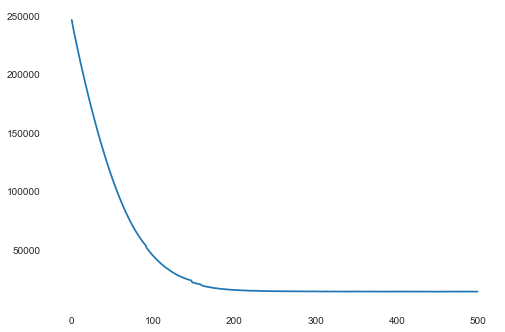

In [26]:
plt.plot(history.history["val_loss"])
plt.show()

In [27]:
from sklearn.metrics import mean_absolute_error, r2_score

In [28]:
y_pred = model.predict(X_test)

In [29]:
mean_absolute_error(y_test, y_pred)

94.09917747685972

In [30]:
r2_score(y_test, y_pred)

0.6189220961213159

In [31]:
model.save_weights("weights.h5")

In [32]:
from tensorflow.keras.models import save_model

In [33]:
save_model(model, "my_model.h5")

In [34]:
from sklearn.svm import SVR

In [35]:
svr = SVR()

In [36]:
svr.fit(X_train, y_train)

SVR()

In [37]:
y_pred = svr.predict(X_test)

In [38]:
mean_absolute_error(y_test, y_pred)

108.36941986279041

In [39]:
r2_score(y_test, y_pred)

0.5088501257550171